In [1]:
import torch
from torch_geometric.data import InMemoryDataset, download_url
import pandas as pd

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

import numpy as np
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt

# Data loading and preparation

In [16]:
edges = pd.read_csv("../data/interim/edges.csv")

In [17]:
# noisy = pd.read_csv("../data/interim/noisy_cells.csv")

In [18]:
# noisy =  noisy["cell.names"]

In [19]:
# edges = edges[~edges.node1.isin(noisy)]

In [20]:
edges[edges.type == "sc2vis"][edges[edges.type == "sc2vis"].celltype_major.isna()]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone


In [21]:
overcl = pd.read_csv("../data/interim/clones_over.csv")

In [22]:
overcl.columns = ["node1","clone"]

In [23]:
overcl.clone.unique()

array(['16', '10', '0', 'diploid', '12', '8', '13', '14', '1', '7', '15',
       '4', '6', '9', '5', '11', '2', '3'], dtype=object)

In [24]:
edges = edges.drop(columns = ["clone"])


In [25]:
overcl = edges[edges["type"] == "sc2vis"].merge(overcl,left_on = "node1",right_on ="node1",how = "left")

In [26]:
overcl.clone = overcl.clone.fillna("diploid")

In [27]:
overcl.clone.unique()

array(['diploid', '11', '2', '10', '8', '6', '1', '13', '4', '15', '14',
       '9', '7', '0', '5', '12', '16', '3'], dtype=object)

In [28]:
edges= edges.merge(overcl[["clone","node1"]],left_on = "node1",right_on ="node1",how = "left")

In [29]:
emb_vis = pd.read_csv("../data/interim/embedding_visium_scvi.csv", index_col = 0)
emb_rna = pd.read_csv("../data/interim/embedding_rna2vis_scvi.csv", index_col = 0)

In [30]:
all_nodes_graph = set(edges.node1.to_list() + edges.node2.to_list())
all_nodes_emb = set(emb_vis.index).union(set(emb_rna.index))
all_nodes = list(all_nodes_graph.intersection(all_nodes_emb))
node_encoder = {all_nodes[i]:i for i in range(len(all_nodes))}
emb_vis = emb_vis.loc[emb_vis.index.isin(all_nodes)]
emb_rna = emb_rna.loc[emb_rna.index.isin(all_nodes)]

In [31]:
edges = edges[edges.node1.isin(all_nodes)]

In [32]:
edges = edges[edges.node2.isin(all_nodes)]

In [33]:
edges.node1 = edges.node1.map(node_encoder)

In [34]:
edges.node2 = edges.node2.map(node_encoder)

In [35]:
emb_vis = emb_vis.rename(index = node_encoder)
emb_rna = emb_rna.rename(index = node_encoder)

In [36]:
len(all_nodes)

34079

In [37]:
edge_index = torch.tensor([edges.node1,
                           edges.node2], dtype=torch.long)

In [38]:
features = pd.concat([emb_vis, emb_rna])

In [39]:
features = features.sort_index()

In [40]:
x = torch.tensor(features.values , dtype=torch.float)

In [41]:
edges[edges.type == "vis2grid"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,21005,14115,vis2grid,NaN,NaN,NaN
2908701,298911,21005,14017,vis2grid,NaN,NaN,NaN
2908702,298912,32821,10689,vis2grid,NaN,NaN,NaN
2908703,298913,32821,5930,vis2grid,NaN,NaN,NaN
2908704,298914,32821,25171,vis2grid,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2928253,318463,13941,13568,vis2grid,NaN,NaN,NaN
2928254,318464,13941,4253,vis2grid,NaN,NaN,NaN
2928255,318465,13941,1387,vis2grid,NaN,NaN,NaN
2928256,318466,20856,32644,vis2grid,NaN,NaN,NaN


In [42]:
edges.clone = edges.clone.fillna("missing")

In [43]:
edges[edges.clone == "missing"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,21005,14115,vis2grid,NaN,NaN,missing
2908701,298911,21005,14017,vis2grid,NaN,NaN,missing
2908702,298912,32821,10689,vis2grid,NaN,NaN,missing
2908703,298913,32821,5930,vis2grid,NaN,NaN,missing
2908704,298914,32821,25171,vis2grid,NaN,NaN,missing
...,...,...,...,...,...,...,...
2928253,318463,13941,13568,vis2grid,NaN,NaN,missing
2928254,318464,13941,4253,vis2grid,NaN,NaN,missing
2928255,318465,13941,1387,vis2grid,NaN,NaN,missing
2928256,318466,20856,32644,vis2grid,NaN,NaN,missing


In [44]:
nodes_atr = edges[["node1","type","celltype_major", "clone"]].drop_duplicates()

In [45]:
nodes_atr = nodes_atr.sort_values(by = "node1")

In [46]:
nodes_atr.clone.unique()

array(['diploid', '1', '4', 'missing', '5', '0', '16', '10', '11', '7',
       '12', '2', '6', '14', '13', '9', '15', '8', '3'], dtype=object)

In [47]:
nodes_atr.celltype_major = nodes_atr.celltype_major.fillna("missing")

In [48]:
nodes_atr

,node1,type,celltype_major,clone
1837900,0,sc2vis,B.cells,diploid
1368200,1,sc2vis,T.cells,diploid
2406800,2,sc2vis,Endothelial,diploid
2511600,3,sc2vis,CAFs,diploid
1384800,4,sc2vis,Plasmablasts,diploid
...,...,...,...,...
1838400,34074,sc2vis,CAFs,2
178800,34075,sc2vis,T.cells,diploid
188700,34076,sc2vis,Cancer Epithelial,1
2923958,34077,vis2grid,missing,missing


In [49]:
from collections import Counter

Counter(nodes_atr.celltype_major)

Counter({'B.cells': 1018,
         'T.cells': 5983,
         'Endothelial': 1346,
         'CAFs': 2592,
         'Plasmablasts': 1275,
         'Myeloid': 3868,
         'Cancer Epithelial': 8503,
         'missing': 4992,
         'Normal Epithelial': 4033,
         'PVL': 469})

In [50]:
ct_list = list(nodes_atr.celltype_major.unique())
ct_list.remove("missing")

In [51]:
Counter(nodes_atr.clone)

Counter({'diploid': 19626,
         '1': 1236,
         '4': 801,
         'missing': 4992,
         '5': 816,
         '0': 1502,
         '16': 61,
         '10': 511,
         '11': 367,
         '7': 599,
         '12': 315,
         '2': 925,
         '6': 645,
         '14': 224,
         '13': 304,
         '9': 483,
         '15': 67,
         '8': 583,
         '3': 22})

In [52]:
clone_list = list(nodes_atr.clone.unique())
clone_list.remove("missing")
clone_list.remove("diploid")
clone_dict = {x:int(x) for x in clone_list}
clone_dict["missing"] = -1
clone_dict["diploid"] = len(clone_dict)-1

In [53]:
clone_dict

{'1': 1,
 '4': 4,
 '5': 5,
 '0': 0,
 '16': 16,
 '10': 10,
 '11': 11,
 '7': 7,
 '12': 12,
 '2': 2,
 '6': 6,
 '14': 14,
 '13': 13,
 '9': 9,
 '15': 15,
 '8': 8,
 '3': 3,
 'missing': -1,
 'diploid': 17}

In [54]:
type_dict = {ct_list[i]:i for i in range(len(ct_list))}

In [55]:
type_dict["missing"] = -1

In [56]:
type_dict

{'B.cells': 0,
 'T.cells': 1,
 'Endothelial': 2,
 'CAFs': 3,
 'Plasmablasts': 4,
 'Myeloid': 5,
 'Cancer Epithelial': 6,
 'Normal Epithelial': 7,
 'PVL': 8,
 'missing': -1}

In [57]:
nodes_atr.clone = nodes_atr.clone.map(clone_dict)

In [58]:
edges.celltype_major = edges.celltype_major.fillna("missing")

In [59]:
nodes_atr.celltype_major = nodes_atr.celltype_major.map(type_dict)

In [60]:
nodes_atr = nodes_atr.set_index("node1")

In [61]:
nodes_atr.head()

,type,celltype_major,clone
node1,,,
0,sc2vis,0,17
1,sc2vis,1,17
2,sc2vis,2,17
3,sc2vis,3,17
4,sc2vis,4,17


In [62]:
features = features.join(nodes_atr)

In [63]:
features.clone = features.clone.fillna(-1)

In [64]:
features.celltype_major = features.celltype_major.fillna(-1)

In [65]:
y_clone = torch.tensor(features.clone.values,dtype=torch.long)


In [66]:
y_type = torch.tensor(features.celltype_major.values,dtype=torch.long)

In [67]:
y_type.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8])

In [68]:
y_clone.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17])

In [69]:
data = Data(x=x, edge_index=edge_index, y_clone = y_clone,y_type = y_type, edge_type = edges.type.values)

In [70]:
data.validate(raise_on_error=True)


True

In [71]:
hold_out = torch.tensor(np.where(data.y_clone == -1)[0],dtype=torch.long)

In [72]:
tot_size = data.x.shape[0] -len(hold_out)
train_size = int(0.8*tot_size)
hold_in = np.arange(data.x.shape[0])
hold_in = [x for x in hold_in if x not in  hold_out]

In [73]:
len(hold_out)

4992

In [74]:
data.y_type[hold_in].unique()

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [75]:
data.y_clone[hold_in].unique()

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])

In [76]:
from sklearn.model_selection import train_test_split

train_samp,test_samp,_,_ = train_test_split(hold_in,data.y_clone[hold_in], stratify = data.y_clone[hold_in], test_size=0.2, random_state=42)


In [77]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [78]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [79]:
y_train = data.y_type[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_type = 1. / class_sample_count

In [80]:
y_train = data.y_clone[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_clone = 1. / class_sample_count

In [81]:
weight_clone = torch.tensor(weight_clone, dtype=torch.float)
weight_type = torch.tensor(weight_type, dtype=torch.float)

In [82]:
len(edges.clone.unique())

19

In [83]:
data.num_classes_clone = len(y_clone.unique())
data.num_classes_type = len(y_type.unique())

In [84]:



class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(data.num_node_features, 16)
        self.conv2 = GCNConv(16, 16)
        self.conv3 = GCNConv(16, 16)


        # self.conv_clone = GCNConv(16, data.num_classes_clone - 1)
        # self.conv_type = GCNConv(16, data.num_classes_type-1)
        self.out = GCNConv(16,data.num_classes_clone +  data.num_classes_type -2)


    def forward(self, x, edge_index):

        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        x = self.conv3(x, edge_index)

        x_pre = F.relu(x)
        x_out = self.out(x_pre, edge_index)


        return (x_out)

In [98]:
device = torch.device('cuda:0')
model = GCN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

In [86]:
weight_clone = weight_clone.to(device)
weight_type = weight_type.to(device)

In [99]:
data = data.to(device)


In [88]:
def test():
    model.eval()
    with torch.no_grad():
        pred = model(data.x, data.edge_index)
        pred_clone = pred[:,:data.num_classes_clone-1]
        pred_cell_type = pred[:,data.num_classes_clone-1:]
        pred_clone = F.log_softmax(pred_clone, dim=1)
        loss_clone = weighted_loss(pred_clone[data.test_mask], norm_sim, data.y_clone[data.test_mask],weight_clone)

        pred_clone = pred_clone.argmax(dim=1)
        pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
        loss_ct = F.nll_loss(pred_cell_type[data.test_mask], data.y_type[data.test_mask], weight = weight_type)
        pred_cell_type = pred_cell_type.argmax(dim=1)

        correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
        correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

        acc_clone = int(correct_clones) / len(data.test_mask)
        acc_type = int(correct_types) / len(data.test_mask)
        

    
    # reducer = umap.UMAP()
    # emb = pred[-1].detach().numpy()
    # scaled_penguin_data = StandardScaler().fit_transform(emb)
    # embedding = reducer.fit_transform(scaled_penguin_data)
    # sns.scatterplot(x = embedding[:, 0], y = embedding[:, 1], hue = data.node_type)
    # plt.show()
        return(acc_clone,acc_type, loss_clone,loss_ct)

In [100]:
norm_sim = np.load("../data/interim/clone_dist_over.npy")

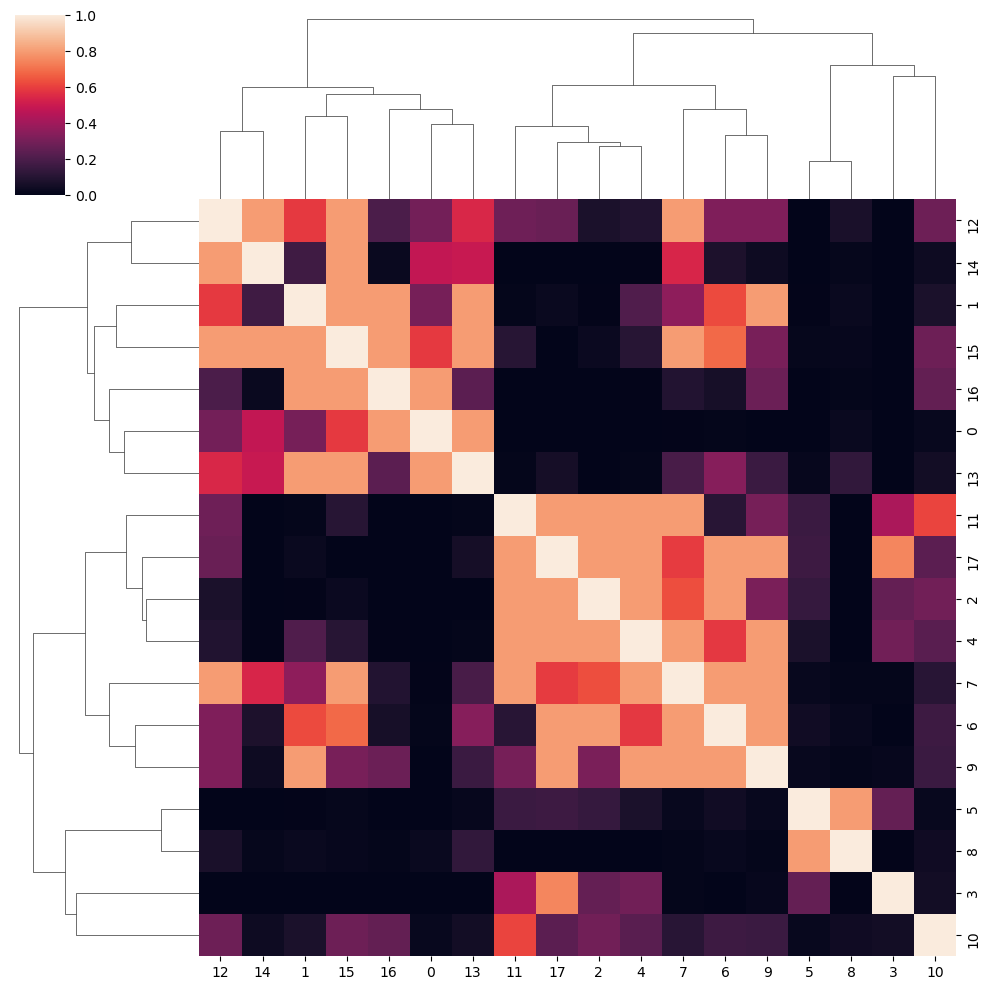

In [102]:
import seaborn as sns
sns.clustermap(norm_sim)

In [247]:
# norm_sim = np.identity(norm_sim.shape[0])

In [103]:
norm_sim = torch.tensor(norm_sim)
norm_sim = norm_sim.to(device)

In [104]:
def weighted_loss(probabilities, norm_sim, target, weight):
        probabilities = torch.exp(probabilities) 
        similarity = torch.tensor(norm_sim[target,:]).to(device)
        level_loss=-torch.log((probabilities * similarity).sum(axis = 1))
        level_loss_weighted = level_loss * weight[target]
        reduction = (level_loss_weighted / weight[target].sum()).sum()
        return(reduction)
def check_split(y):
    #chec if all classes are present in both train and test set
    num_classes = len(y.unique()) -1
    assert sum(y[data.train_mask].unique() == y[data.train_mask].unique()) == num_classes
    

In [94]:
check_split(data.y_type)

In [95]:
check_split(data.y_clone)

In [105]:
eps = 1e-4
loss_old = 100
losses = {}
accuracy = {}
losses["clone"] = dict({"train":[],"test":[]})
losses["cell_type"] = dict({"train":[],"test":[]})
accuracy["clone"] = dict({"train":[],"test":[]})
accuracy["cell_type"] = dict({"train":[],"test":[]})
no_improv = 0
for epoch in range(300):
    model.train()
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    loss_clone = weighted_loss(pred_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask],weight_clone)
    # loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)

    losses["clone"]["train"].append(loss_clone.item())

    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)
    losses["cell_type"]["train"].append(loss_type.item())
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    
    acc_clone,acc_type, loss_clone_test,loss_ct_test = test()
    if epoch%20==0:
        print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f} \t Cell type prediction loss: {loss_type.item():.3f}")
        print(f"TEST: Clone accuracy {acc_clone:.4f} \t Cell type accuracy: {acc_type:.4f}")
    accuracy["clone"]["test"].append(acc_clone)
    accuracy["cell_type"]["test"].append(acc_type)
    losses["cell_type"]["test"].append(loss_ct_test.detach().cpu().item())
    losses["clone"]["test"].append(loss_clone_test.detach().cpu().item())


    # loss = loss_clone + loss_type

    if (loss_old- loss_clone.item() <eps):
        no_improv += 1
        print(f"no improvement ({no_improv})")
    else:
        no_improv = 0
    if (no_improv >10) & (epoch>100):
        print("EARLY STOPPING")
        break
    loss_old = loss_clone.item()
print("DONE")


/tmp/ipykernel_118253/3033082611.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  similarity = torch.tensor(norm_sim[target,:]).to(device)


epoch 0: Clone prediction loss 1.216 	 Cell type prediction loss: 2.182
TEST: Clone accuracy 0.3419 	 Cell type accuracy: 0.0706
epoch 20: Clone prediction loss 0.725 	 Cell type prediction loss: 1.417
TEST: Clone accuracy 0.4943 	 Cell type accuracy: 0.5524
epoch 40: Clone prediction loss 0.605 	 Cell type prediction loss: 1.216
TEST: Clone accuracy 0.4091 	 Cell type accuracy: 0.6545
epoch 60: Clone prediction loss 0.572 	 Cell type prediction loss: 1.104
TEST: Clone accuracy 0.4502 	 Cell type accuracy: 0.7044
epoch 80: Clone prediction loss 0.557 	 Cell type prediction loss: 1.043
TEST: Clone accuracy 0.4632 	 Cell type accuracy: 0.7289
no improvement (1)
no improvement (2)
no improvement (3)
no improvement (1)
no improvement (1)
no improvement (1)
no improvement (1)
no improvement (2)
no improvement (1)
epoch 100: Clone prediction loss 0.546 	 Cell type prediction loss: 1.012
TEST: Clone accuracy 0.4655 	 Cell type accuracy: 0.7121
no improvement (1)
no improvement (2)
no improvem

In [107]:
norm_sim = np.identity(norm_sim.shape[0])
norm_sim = torch.tensor(norm_sim)
norm_sim = norm_sim.to(device)

In [108]:
for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    loss_clone = weighted_loss(pred_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask],weight_clone)
    # loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)

    losses["clone"]["train"].append(loss_clone.item())

    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)
    losses["cell_type"]["train"].append(loss_type.item())
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    
    acc_clone,acc_type, loss_clone_test,loss_ct_test = test()
    if epoch%20==0:
        print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f} \t Cell type prediction loss: {loss_type.item():.3f}")
        print(f"TEST: Clone accuracy {acc_clone:.4f} \t Cell type accuracy: {acc_type:.4f}")
    accuracy["clone"]["test"].append(acc_clone)
    accuracy["cell_type"]["test"].append(acc_type)
    losses["cell_type"]["test"].append(loss_ct_test.detach().cpu().item())
    losses["clone"]["test"].append(loss_clone_test.detach().cpu().item())


    loss_old = loss_clone.item()


/tmp/ipykernel_118253/3033082611.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  similarity = torch.tensor(norm_sim[target,:]).to(device)


epoch 0: Clone prediction loss 17.840 	 Cell type prediction loss: 0.952
TEST: Clone accuracy 0.5036 	 Cell type accuracy: 0.7479
epoch 20: Clone prediction loss 2.351 	 Cell type prediction loss: 1.123
TEST: Clone accuracy 0.4978 	 Cell type accuracy: 0.6721
epoch 40: Clone prediction loss 2.195 	 Cell type prediction loss: 1.028
TEST: Clone accuracy 0.4149 	 Cell type accuracy: 0.6875
epoch 60: Clone prediction loss 2.129 	 Cell type prediction loss: 1.002
TEST: Clone accuracy 0.4342 	 Cell type accuracy: 0.7257
epoch 80: Clone prediction loss 2.098 	 Cell type prediction loss: 0.980
TEST: Clone accuracy 0.4462 	 Cell type accuracy: 0.7363


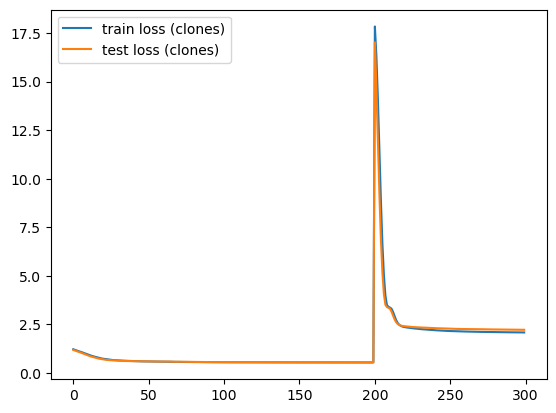

In [109]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(losses["clone"]["train"], label = "train loss (clones)")
plt.plot(losses["clone"]["test"], label = "test loss (clones)")

plt.legend()
plt.show()

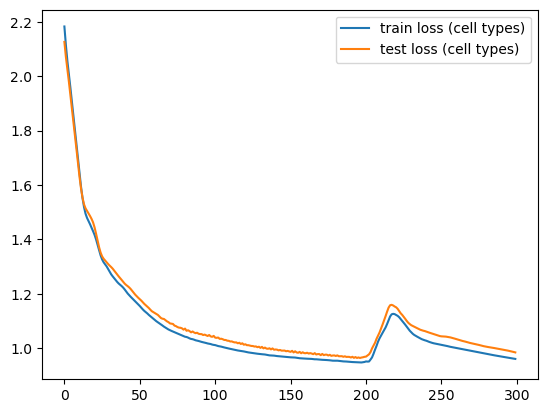

In [110]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(losses["cell_type"]["train"], label = "train loss (cell types)")
plt.plot(losses["cell_type"]["test"], label = "test loss (cell types)")

plt.legend()
plt.show()

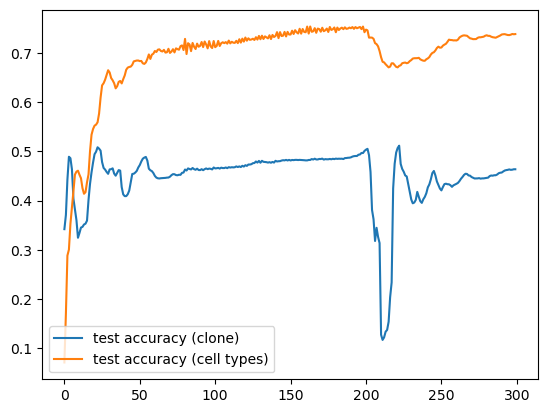

In [111]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(accuracy["clone"]["test"], label = "test accuracy (clone)")
plt.plot(accuracy["cell_type"]["test"], label = "test accuracy (cell types)")

plt.legend()
plt.show()

In [112]:
model.eval()
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = F.log_softmax(pred_clone, dim=1)
pred_clone1 = pred_clone.argmax(dim=1)
pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
pred_cell_type1 = pred_cell_type.argmax(dim=1)

correct_clones = (pred_clone1[data.test_mask] == data.y_clone[data.test_mask]).sum()
correct_types = (pred_cell_type1[data.test_mask] == data.y_type[data.test_mask]).sum()

acc_clone = int(correct_clones) / len(data.test_mask)
acc_type = int(correct_types) / len(data.test_mask)

print(f'Accuracy clones: {acc_clone:.4f}')
print(f'Accuracy cell types: {acc_type:.4f}')

Accuracy clones: 0.4637
Accuracy cell types: 0.7387


In [113]:
clone_rev = {val:key for key,val in clone_dict.items()}
type_rev = {val:key for key,val in type_dict.items()}
node_encoder_rev = {val:key for key,val in node_encoder.items()}

In [114]:
pred_clone

tensor([[ -9.5268,  -6.3059,  -2.9815,  ...,  -8.2555, -15.2293,  -0.3633],
        [ -6.5363,  -3.8911,  -2.6157,  ...,  -7.0168,  -7.4955,  -0.4169],
        [-13.0020,  -8.6745,  -4.0381,  ...,  -9.1429, -17.2564,  -0.8404],
        ...,
        [ -1.6368,  -2.2183,  -3.3547,  ...,  -2.0174,  -1.6019,  -4.9764],
        [-14.3284, -10.5965,  -6.7927,  ..., -10.9176, -23.8825,  -6.8705],
        [ -4.1421,  -3.7622,  -3.6493,  ...,  -3.2414,  -7.5414,  -2.6113]],
       device='cuda:0', grad_fn=<LogSoftmaxBackward0>)

In [115]:
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = np.exp(F.log_softmax(pred_clone, dim=1).detach().cpu().numpy())
pred_cell_type = np.exp(F.log_softmax(pred_cell_type, dim=1).detach().cpu().numpy())

In [116]:
pred_clone

array([[7.2872157e-05, 1.8255153e-03, 5.0717805e-02, ..., 2.5983108e-04,
        2.4321301e-07, 6.9534862e-01],
       [1.4498718e-03, 2.0422677e-02, 7.3115274e-02, ..., 8.9666428e-04,
        5.5557722e-04, 6.5911967e-01],
       [2.2557037e-06, 1.7088193e-04, 1.7631110e-02, ..., 1.0697874e-04,
        3.2035167e-08, 4.3153673e-01],
       ...,
       [1.9459569e-01, 1.0878997e-01, 3.4918889e-02, ..., 1.3300389e-01,
        2.0151037e-01, 6.8985815e-03],
       [5.9876203e-07, 2.5003692e-05, 1.1219111e-03, ..., 1.8136339e-05,
        4.2459716e-11, 1.0379356e-03],
       [1.5889905e-02, 2.3231624e-02, 2.6009437e-02, ..., 3.9108593e-02,
        5.3065852e-04, 7.3439330e-02]], dtype=float32)

In [117]:
cells_hold_out =[node_encoder_rev[x.item()] for x in data.hold_out]

In [118]:
clone_res = pd.DataFrame(pred_clone[data.hold_out.detach().cpu().numpy()], index = cells_hold_out)

In [119]:
clone_res.columns =list(np.arange(pred_clone.shape[1]))[:-1] + ["diploid"]

In [120]:
ct_res = pd.DataFrame(pred_cell_type[data.hold_out.detach().cpu().numpy()], index = cells_hold_out)
ct_res.columns = [type_rev[x] for x in ct_res.columns]

In [121]:
import scanpy as sc


In [122]:
path = "../data/raw/visium/"
visium = sc.read_visium(path, genome=None, count_file='CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5',
                        library_id=None, load_images=True, source_image_path=None)
visium.var_names_make_unique()

/home/o313a/miniconda3/envs/torch_gnn/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [123]:
coor_int = [[int(x[0]),int(x[1])] for x in visium.obsm["spatial"]]
visium.obsm["spatial"] = np.array(coor_int)

In [124]:
clones_columns = clone_res.columns
ct_columns = ct_res.columns

In [125]:
visium.obs = visium.obs.join(clone_res).join(ct_res)

In [126]:
visium.obs["clone"] = visium.obs[clones_columns].idxmax(axis = 1)

In [127]:
visium.obs["clone"].unique()

array(['diploid', 5, 10, 3, 0, 11, 8, 12, 16, 13, 14, 6, 4, 1, 7, 9],
      dtype=object)

In [128]:
visium.obs.clone = visium.obs.clone.astype("str")

In [129]:
import matplotlib as mpl


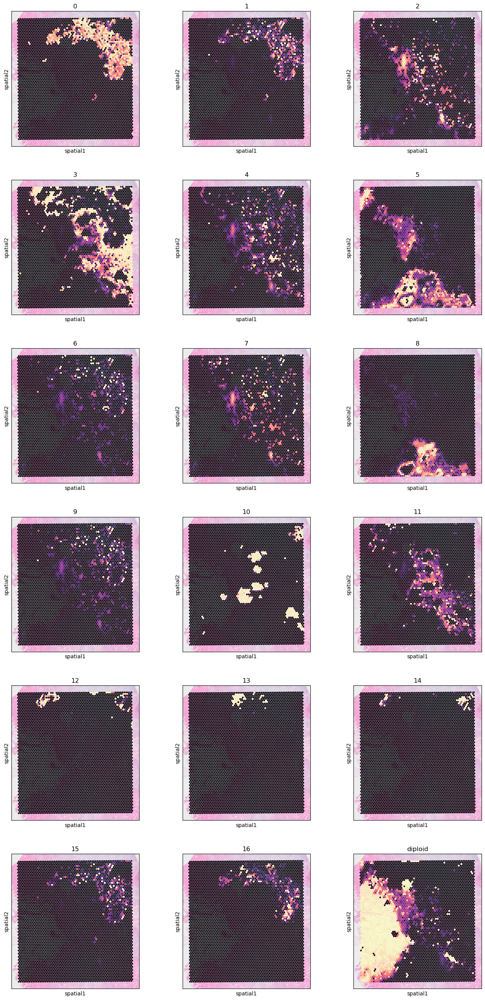

In [130]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=clones_columns,
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  colorbar_loc = None
                 )

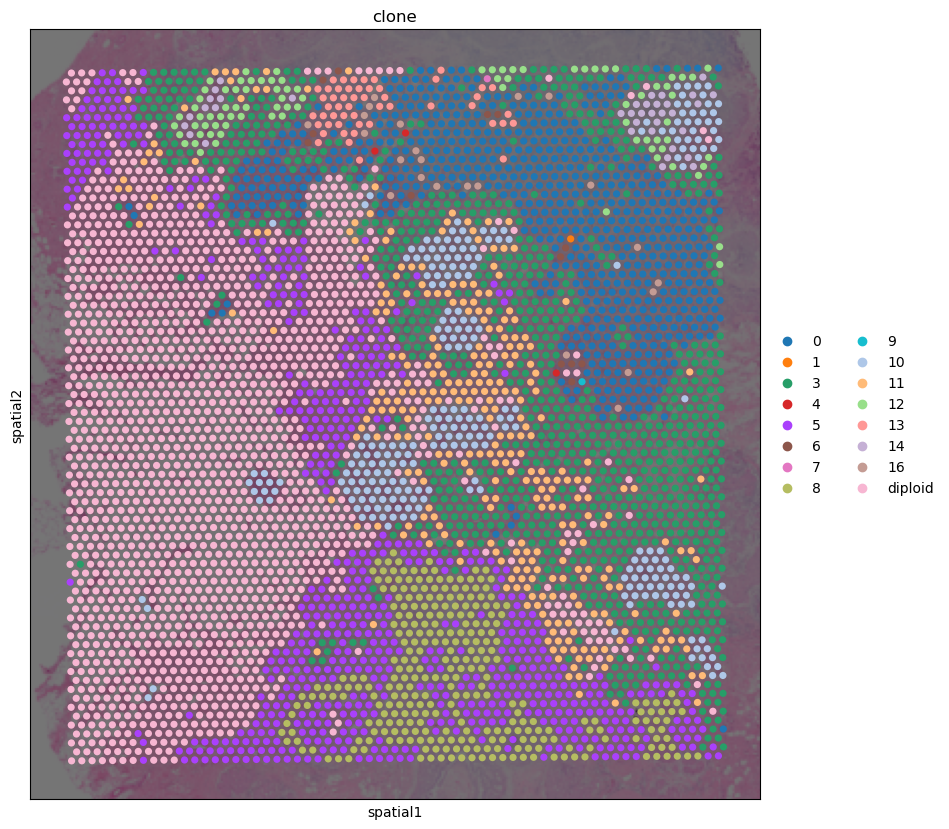

In [131]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color="clone",
                img_key='lowres', alpha_img = 0.5,
                 )

In [132]:
visium.obs["cell_type"] = visium.obs[ct_columns].idxmax(axis = 1)

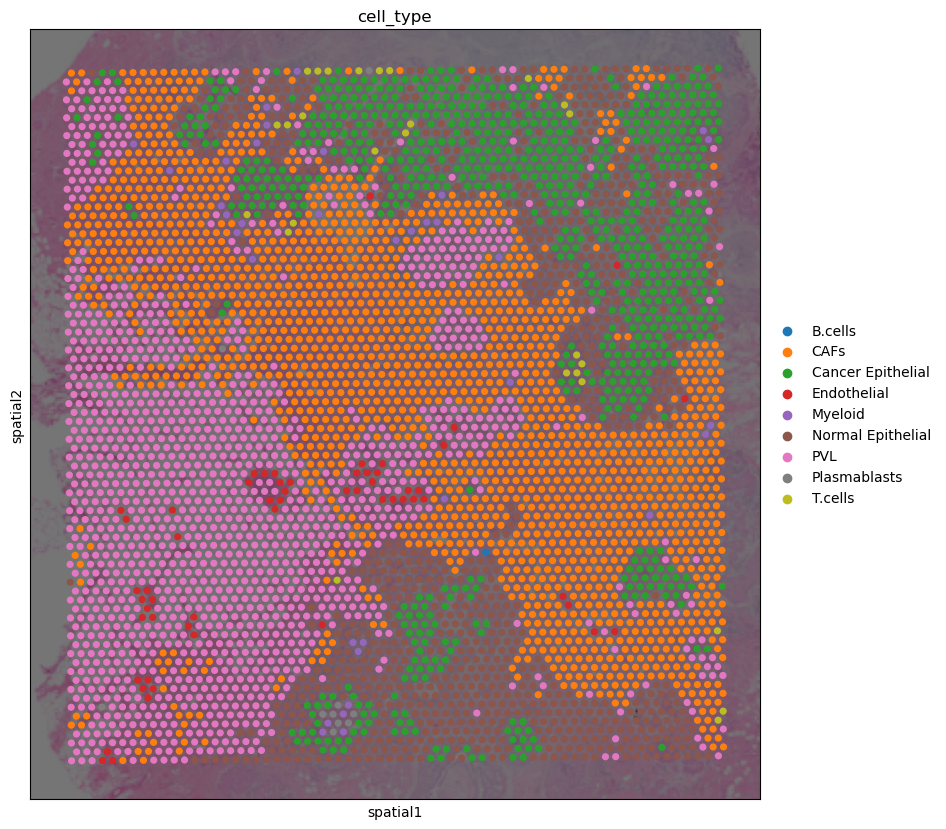

In [133]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color="cell_type",
                img_key='lowres', alpha_img = 0.5,
                 )

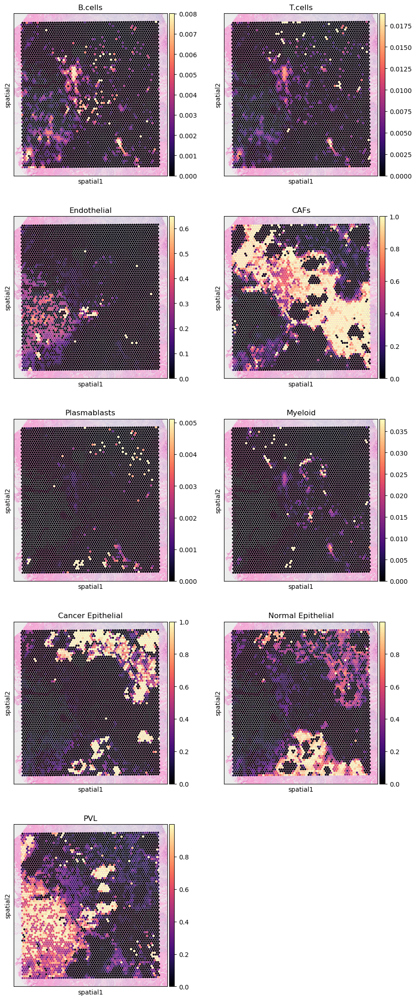

In [134]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=ct_columns,
                  ncols=2, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  show=False
                 )

In [136]:
visium.obs.columns = [str(x) for x in visium.obs.columns]

In [137]:
visium.write("../data/interim/visium_annotated_over.h5ad")
